# CRIME DATA ON THE MAP

## packages

In [192]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import geopandas as gpd

## functions

In [193]:
# list of the police files
def crime_source(police, year, months):
    crime_pth = []
    for p in police:
        for y in year:
            for m in months:
                crime_pth.append('C:\\Datasets\\Crime_UK_2020\\'+y+'-'+m+'-'+p+'-street.csv')
    return crime_pth

def map_source(maps):
    map_pth = 'C:\\Datasets\\Crime_UK_2020\\'+maps[0]+'.png'
    return map_pth

def coordinates(maps):
    coord = pd.read_csv(coord_path,sep='\t')
    return coord

def MapBox(coord):
    long1 = coord[coord.name==maps[0]].iloc[:,1].values[0]
    long2 = coord[coord.name==maps[0]].iloc[:,2].values[0]
    lat1 = coord[coord.name==maps[0]].iloc[:,3].values[0]
    lat2 = coord[coord.name==maps[0]].iloc[:,4].values[0]
    MapBox2 = (long1,long2,lat1,lat2)
    return MapBox2

def crime_merge(crime_pth):
    crime_all=pd.DataFrame(columns=['Crime ID','Month','Reported by','Falls within','Longitude',
                               'Latitude','Location','LSOA code','LSOA name','Crime type',
                               'Last outcome category','Context'])
    for i in range(len(crime_pth)):
#        print(i,crime_pth[i] )
        crime_all=crime_all.append(pd.read_csv(crime_pth[i]))
    return crime_all

def map_read(map_pth):
    map_img  =plt.imread(map_pth)
    return map_img

def crime_allf():
    crime_all1 = crime_all[crime_all.Location != 'No Location']

    print('merged data with location data dimension:',crime_all1.shape)
    crime_all1 = crime_all1[(crime_all1.Longitude>=long1) & (crime_all1.Longitude<=long2) & (crime_all1.Latitude>=lat1) &
                   (crime_all1.Latitude<=lat2)]
    print('in the box data dimension:',crime_all1.shape)
    return crime_all1

def MapBox2f(MapBox2):
    MapBox = ((crime_all.Longitude.min(),crime_all.Longitude.max(),      
         crime_all.Latitude.min(), crime_all.Latitude.max()))
    print(f'Data generated MapBox coordinates:',MapBox,f'\nMy predifined MapBox coordinates:' ,MapBox2)

def MxCrime():
    print(crime_all.groupby('Crime type').count()[['Month']])
    loc_freq = crime_all.groupby(['Longitude','Latitude']).count()[['Month']]
    print('\nMaximum number of crime in one scene:', loc_freq.max()[0])
    mflong = loc_freq[loc_freq.Month==loc_freq.max()[0]].reset_index().iloc[0,0]
    mflat = loc_freq[loc_freq.Month==loc_freq.max()[0]].reset_index().iloc[0,1]
    print(f'The coordinates of this crime scene:',mflong,mflat)
    max_crime = (mflong, mflat)
    # here I create a table which contains the most frequent crime name and ratio
    df1 = crime_all.groupby(['Longitude','Latitude']).count()[['Month']].reset_index()
    df2 = crime_all.groupby(['Longitude','Latitude','Crime type']).count()[['Month']].reset_index()
    df3 = df2.groupby(['Longitude','Latitude']).max()[['Month']].reset_index()
    df4 = pd.merge(df2, df3,  how='inner', left_on=['Longitude','Latitude','Month'], right_on = ['Longitude','Latitude','Month'])
    df4.drop_duplicates(subset =["Longitude","Latitude"], keep = 'first', inplace = True)
    df4 = df4.rename(columns={"Month": "MaxCount"})

    df5 = pd.merge(df1, df4,  how='inner', left_on=['Longitude','Latitude'], right_on = ['Longitude','Latitude'])
    df5['maxRatio%'] = 100*df5["MaxCount"]/df5["Month"]
    df["maxRatio%"] = df["maxRatio%"].astype(int)
    df5 = df5.rename(columns={"Month": "Count"})
    return max_crime, loc_freq, df5


def map_display(max_crime,loc_freq):
    mflong=max_crime[0]
    mflat=max_crime[1]
    #fig, ax = plt.subplots(figsize = (30,30))
    fig, ax = plt.subplots(figsize = ar)
    loc_freq = crime_all.groupby(['Longitude','Latitude']).count()[['Month']].reset_index()
    ax.scatter(loc_freq.Longitude, loc_freq.Latitude, zorder=1, alpha= 0.8, c='r', s=loc_freq.Month*20)

    ax.scatter(mflong, mflat, alpha= 0.8, zorder=5, c='y', s=1000)

    ax.set_title('Plotting Crime Data in '+maps[0].capitalize(), fontsize=40)
    ax.set_xlim(MapBox2[0],MapBox2[1])# not necessary at the moment
    ax.set_ylim(MapBox2[2],MapBox2[3])# not necessary at the moment
    ax.imshow(map_img, zorder=0, extent = MapBox2, aspect= 'auto')

    plt.show()


In [194]:
#df3 = df2.pivot_table('Month', ['Longitude', 'Latitude'], 'Crime type')
#df3 = df3.fillna(0)
#df3['combined']= df3.iloc[:,2:].values.tolist()
#df4 = df3.reset_index()
#df4.loc[:,['Longitude','Latitude','combined']]
#df2.groupby(['Longitude','Latitude']).max()[['Month']].reset_index()
#df5.head(15)

In [195]:
pol_list = ['avon-and-somerset','bedfordshire','btp','cambridgeshire','cheshire','city-of-london',
'cleveland','cumbria','derbyshire','devon-and-cornwall','dorset','durham',
'dyfed-powys','essex','gloucestershire','gwent','hampshire','hertfordshire',
'humberside','kent','lancashire','leicestershire','lincolnshire','merseyside',
'metropolitan','norfolk','northamptonshire','northern-ireland','northumbria','north-wales',
'north-yorkshire','nottinghamshire','south-wales','south-yorkshire','staffordshire','suffolk',
'surrey','sussex','thames-valley','warwickshire','west-mercia','west-midlands',
'west-yorkshire','wiltshire']

# From here we can start playing with the downloaded maps
## sources: 
* crime data: https://data.police.uk/data/
* background: map from: https://www.openstreetmap.org/

### 1st Basingstoke

In [196]:
# police files
police = ['hampshire'] # the police identifier in the police files

year=['2020']
months = ['01','02','03','04']
# map name
maps = ['basingstoke']
ar = (30,20) # aspect ratio - if the map seems to distorted, use this to correct it (figsize parameter)

# fix file storing the coordinates of pictures
coord_path = 'C:\\Datasets\\Crime_UK_2020\\map_coordinatesreadme.txt'

merged data with location data dimension: (55614, 12)
in the box data dimension: (3931, 12)
Data generated MapBox coordinates: (-1.220784, -0.961073, 51.219479, 51.327751) 
My predifined MapBox coordinates: (-1.2219, -0.961, 51.2161, 51.328)
                              Month
Crime type                         
Anti-social behaviour           653
Bicycle theft                    16
Burglary                        229
Criminal damage and arson       336
Drugs                           121
Other crime                      64
Other theft                     228
Possession of weapons            47
Public order                    366
Robbery                          46
Shoplifting                     178
Theft from the person            21
Vehicle crime                   144
Violence and sexual offences   1482

Maximum number of crime in one scene: 65
The coordinates of this crime scene: -1.0943969999999998 51.244528


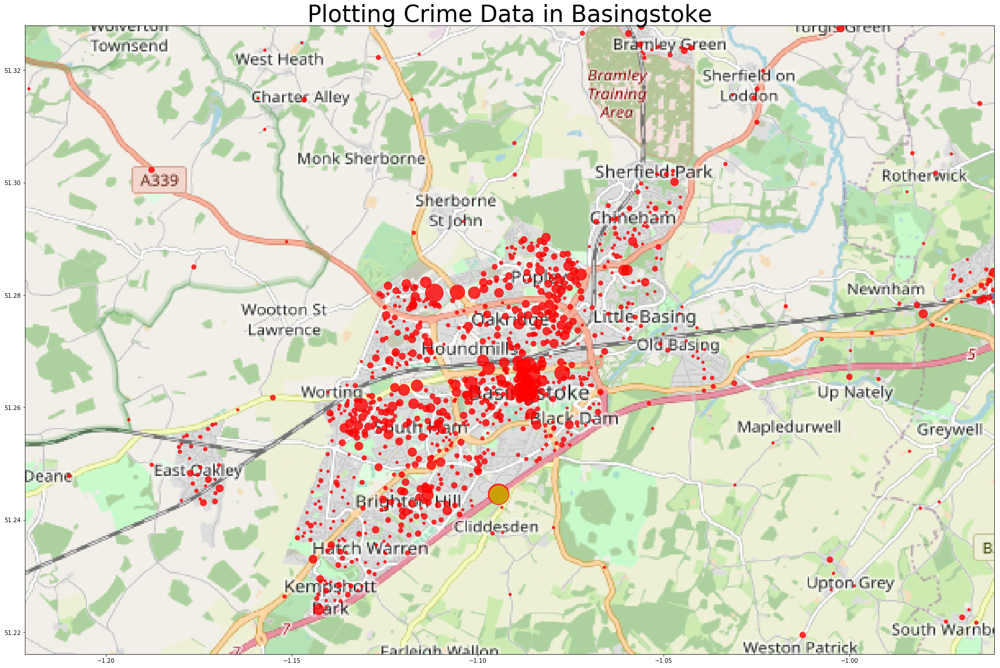

In [197]:
crime_pth = crime_source(police, year, months)
map_pth = map_source(maps)
coord = coordinates(maps)
MapBox2 = MapBox(coord)
long1 = MapBox2[0]
long2 = MapBox2[1]
lat1 = MapBox2[2]
lat2 = MapBox2[3]
crime_all = crime_merge(crime_pth)
map_img = map_read(map_pth)
crime_all = crime_allf()
MapBox2f(MapBox2)
max_crime, loc_freq, df5 = MxCrime()
map_display(max_crime,loc_freq)

### 2nd: Newbury

In [198]:
# police files
police = ['thames-valley'] # the police identifier in the police files

year=['2020']
months = ['01','02','03','04']
# map name
maps = ['newbury2']
ar = (30,20) # aspect ratio - if the map seems to distorted, use this to correct it (figsize parameter)

# fix file storing the coordinates of pictures
coord_path = 'C:\\Datasets\\Crime_UK_2020\\map_coordinatesreadme.txt'

merged data with location data dimension: (54623, 12)
in the box data dimension: (1590, 12)
Data generated MapBox coordinates: (-1.355165, -1.230923, 51.370905, 51.422940999999994) 
My predifined MapBox coordinates: (-1.3613, -1.2308, 51.368, 51.4238)
                              Month
Crime type                         
Anti-social behaviour           261
Bicycle theft                    19
Burglary                         78
Criminal damage and arson       185
Drugs                            76
Other crime                      24
Other theft                      96
Possession of weapons            10
Public order                     53
Robbery                          11
Shoplifting                     128
Theft from the person            16
Vehicle crime                    99
Violence and sexual offences    534

Maximum number of crime in one scene: 60
The coordinates of this crime scene: -1.248739 51.384985


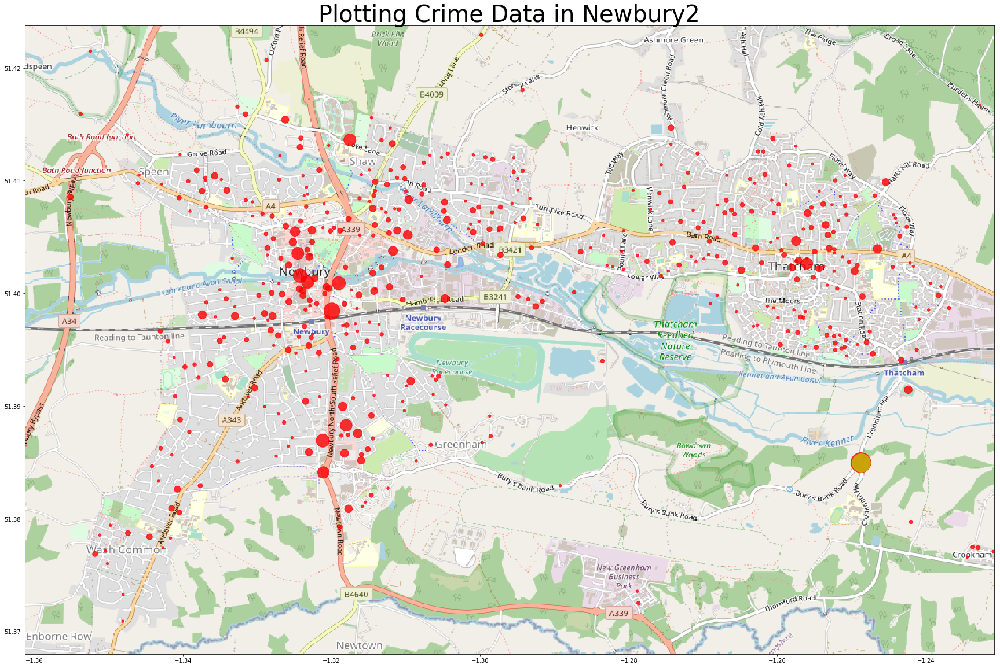

In [199]:
crime_pth = crime_source(police, year, months)
map_pth = map_source(maps)
coord = coordinates(maps)
MapBox2 = MapBox(coord)
long1 = MapBox2[0]
long2 = MapBox2[1]
lat1 = MapBox2[2]
lat2 = MapBox2[3]
crime_all = crime_merge(crime_pth)
map_img = map_read(map_pth)
crime_all = crime_allf()
MapBox2f(MapBox2)
max_crime, loc_freq, df5  = MxCrime()
map_display(max_crime,loc_freq)

### 3rd Ashford

In [200]:
# police files
police = ['thames-valley','metropolitan','btp','surrey'] # the police identifier in the police files

year=['2020']
months = ['01','02','03','04']
# map name
maps = ['ashford']
ar = (30,30) # aspect ratio - if the map seems to distorted, use this to correct it (figsize parameter)

# fix file storing the coordinates of pictures
coord_path = 'C:\\Datasets\\Crime_UK_2020\\map_coordinatesreadme.txt'

merged data with location data dimension: (475737, 12)
in the box data dimension: (5253, 12)
Data generated MapBox coordinates: (-0.541568, -0.41110699999999994, 51.406003999999996, 51.469986999999996) 
My predifined MapBox coordinates: (-0.5416, -0.4111, 51.406, 51.47)
                              Month
Crime type                         
Anti-social behaviour          1471
Bicycle theft                    41
Burglary                        240
Criminal damage and arson       398
Drugs                           205
Other crime                     154
Other theft                     372
Possession of weapons            38
Public order                    344
Robbery                          28
Shoplifting                     165
Theft from the person            41
Vehicle crime                   500
Violence and sexual offences   1256

Maximum number of crime in one scene: 189
The coordinates of this crime scene: -0.451842 51.469708000000004


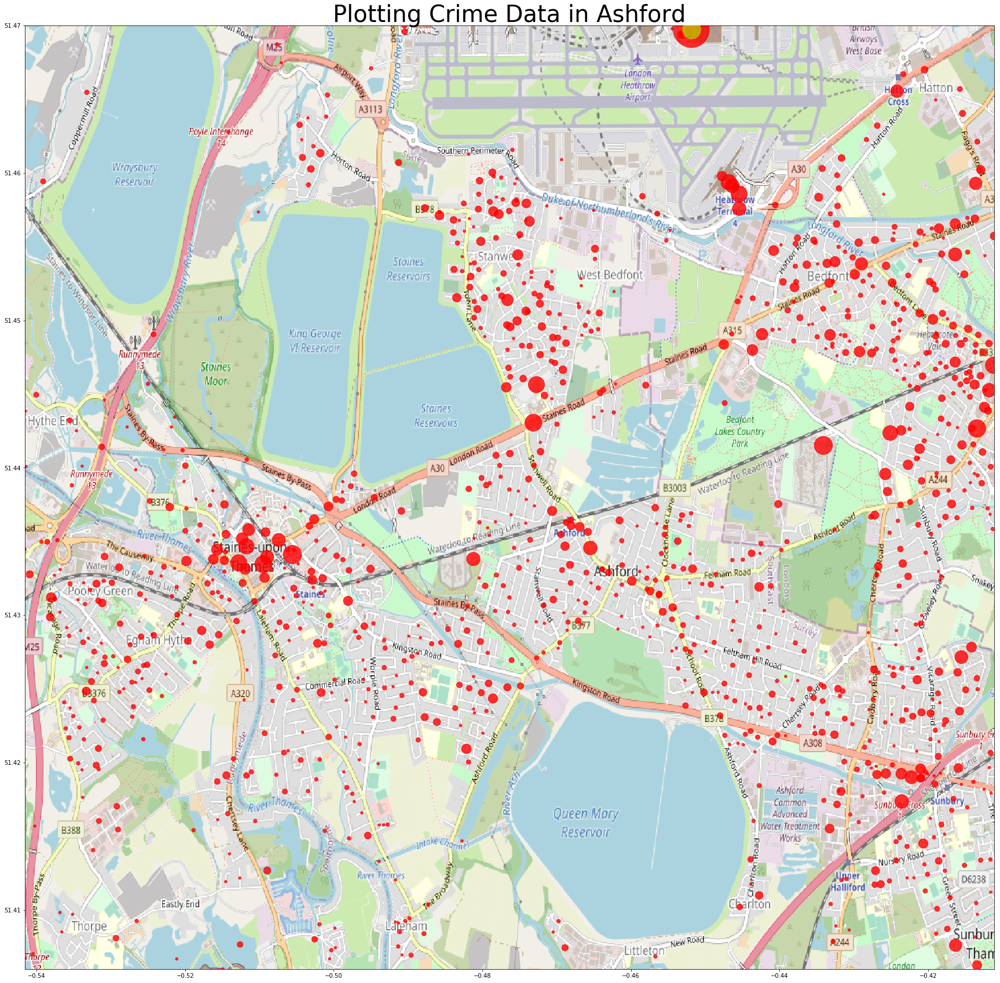

In [201]:
crime_pth = crime_source(police, year, months)
map_pth = map_source(maps)
coord = coordinates(maps)
MapBox2 = MapBox(coord)
long1 = MapBox2[0]
long2 = MapBox2[1]
lat1 = MapBox2[2]
lat2 = MapBox2[3]
crime_all = crime_merge(crime_pth)
map_img = map_read(map_pth)
crime_all = crime_allf()
MapBox2f(MapBox2)
max_crime, loc_freq, df5  = MxCrime()
map_display(max_crime,loc_freq)

### 4th Didcot

In [202]:
# police files
police = ['thames-valley'] # the police identifier in the police files

year=['2020']
months = ['01','02','03','04']
# map name
maps = ['didcot']
ar = (30,20) # aspect ratio - if the map seems to distorted, use this to correct it (figsize parameter)

# fix file storing the coordinates of pictures
coord_path = 'C:\\Datasets\\Crime_UK_2020\\map_coordinatesreadme.txt'

merged data with location data dimension: (54623, 12)
in the box data dimension: (716, 12)
Data generated MapBox coordinates: (-1.317868, -1.189737, 51.586186, 51.634756) 
My predifined MapBox coordinates: (-1.3199, -1.1894, 51.581, 51.6366)
                              Month
Crime type                         
Anti-social behaviour           112
Bicycle theft                     8
Burglary                         37
Criminal damage and arson        93
Drugs                            16
Other crime                      16
Other theft                      49
Possession of weapons             6
Public order                     34
Robbery                           1
Shoplifting                      22
Theft from the person             7
Vehicle crime                    38
Violence and sexual offences    277

Maximum number of crime in one scene: 37
The coordinates of this crime scene: -1.23994 51.607058


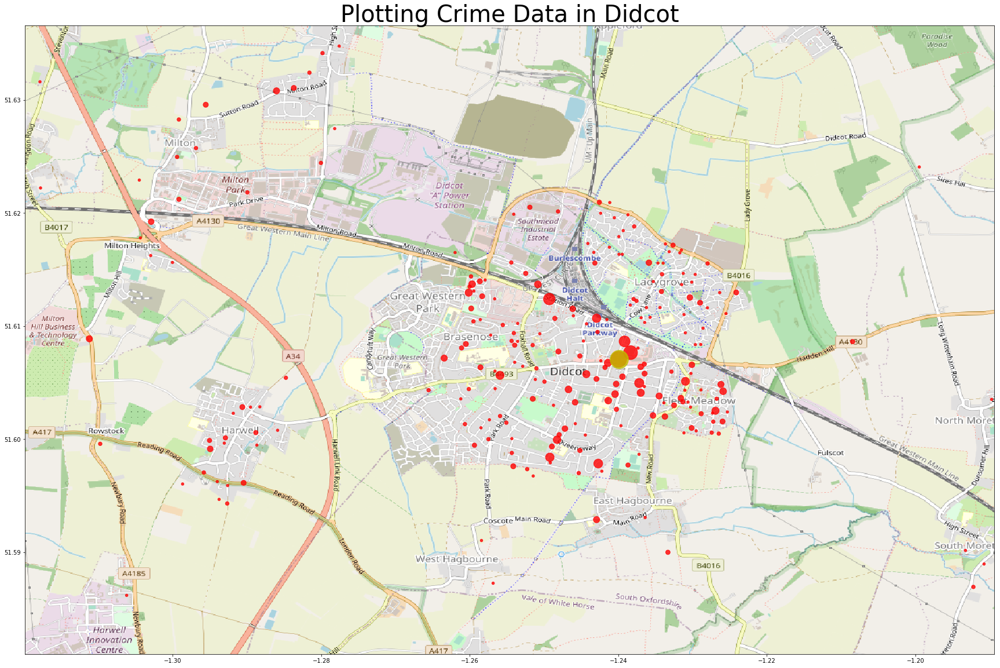

In [203]:
crime_pth = crime_source(police, year, months)
map_pth = map_source(maps)
coord = coordinates(maps)
MapBox2 = MapBox(coord)
long1 = MapBox2[0]
long2 = MapBox2[1]
lat1 = MapBox2[2]
lat2 = MapBox2[3]
crime_all = crime_merge(crime_pth)
map_img = map_read(map_pth)
crime_all = crime_allf()
MapBox2f(MapBox2)
max_crime, loc_freq, df5  = MxCrime()
map_display(max_crime,loc_freq)

# FOLIUM

In [204]:
import folium
from folium import plugins
import ipywidgets
# conda install -c conda-forge geocoder
import geocoder
import geopy
from vega_datasets import data as vds

# Didcot

In [205]:
address = geocoder.osm('Didcot, UK')
long1 = address.lng -0.12
long2 = address.lng +0.12
lat1 = address.lat -0.1
lat2 = address.lat +0.1
MapBox2 = (long1,long2,lat1,lat2)

In [206]:
MapBox2

(-1.3667923000000002, -1.1267923, 51.505690799999996, 51.7056908)

In [207]:
# police files
police = pol_list # the police identifier in the police files

year=['2020']
months = ['01','02','03','04']

In [208]:
crime_pth = crime_source(police, year, months)
crime_all = crime_merge(crime_pth)
crime_all = crime_allf()
MapBox2f(MapBox2)
max_crime, loc_freq, df5 = MxCrime()

merged data with location data dimension: (1990290, 12)
in the box data dimension: (2032, 12)
Data generated MapBox coordinates: (-1.360142, -1.1273950000000001, 51.511244, 51.705595) 
My predifined MapBox coordinates: (-1.3667923000000002, -1.1267923, 51.505690799999996, 51.7056908)
                              Month
Crime type                         
Anti-social behaviour           280
Bicycle theft                    42
Burglary                        122
Criminal damage and arson       235
Drugs                            83
Other crime                      46
Other theft                     116
Possession of weapons            18
Public order                    111
Robbery                           8
Shoplifting                      62
Theft from the person            21
Vehicle crime                   127
Violence and sexual offences    761

Maximum number of crime in one scene: 68
The coordinates of this crime scene: -1.298881 51.67014


In [209]:
#df = loc_freq.reset_index()
df = df5
# create map
map_crime = folium.Map(location=[address.lat,address.lng], zoom_start=13)

folium.raster_layers.TileLayer('Open Street Map').add_to(map_crime)
folium.raster_layers.TileLayer('Stamen Terrain').add_to(map_crime)
folium.raster_layers.TileLayer('Stamen Toner').add_to(map_crime)
folium.raster_layers.TileLayer('Stamen Watercolor').add_to(map_crime)
#folium.raster_layers.TileLayer('CartoDB Positron').add_to(map_crime)
#folium.raster_layers.TileLayer('CartoDB Dark_Matter').add_to(map_crime)

# add layer control to show different maps
folium.LayerControl().add_to(map_crime)

# plot crime locations

df.apply(lambda row: folium.CircleMarker(location=[row['Latitude'], row['Longitude']],radius=row['Count'],
                                         color='black', fill_color='red',alpha = 0.8,
#                                         popup=row['MaxCount']).add_to(map_crime), axis=1)
                                         popup= 'Count:' + str(row.loc['Count']) + '<br />Most Common:' + 
                                         row.loc['Crime type'] + '<br />Ratio:' + str(row.loc['maxRatio%'])).add_to(map_crime), axis=1)
    
# display map    
map_crime

# Newbury

In [210]:
address = geocoder.osm('Newbury, UK')
long1 = address.lng -0.12
long2 = address.lng +0.12
lat1 = address.lat -0.1
lat2 = address.lat +0.1
MapBox2 = (long1,long2,lat1,lat2)

In [211]:
# police files
police = pol_list # the police identifier in the police files

year=['2020']
months = ['01','02','03','04']

In [212]:
crime_pth = crime_source(police, year, months)
crime_all = crime_merge(crime_pth)
crime_all = crime_allf()
MapBox2f(MapBox2)
max_crime, loc_freq, df5 = MxCrime()

merged data with location data dimension: (1990290, 12)
in the box data dimension: (1979, 12)
Data generated MapBox coordinates: (-1.443497, -1.203754, 51.3161, 51.501158000000004) 
My predifined MapBox coordinates: (-1.4436425000000002, -1.2036425, 51.3020055, 51.5020055)
                              Month
Crime type                         
Anti-social behaviour           310
Bicycle theft                    24
Burglary                        116
Criminal damage and arson       215
Drugs                            84
Other crime                      33
Other theft                     141
Possession of weapons            12
Public order                     79
Robbery                          12
Shoplifting                     134
Theft from the person            16
Vehicle crime                   151
Violence and sexual offences    652

Maximum number of crime in one scene: 60
The coordinates of this crime scene: -1.248739 51.384985


In [213]:
#df = loc_freq.reset_index()
df = df5
# create map
map_crime = folium.Map(location=[address.lat,address.lng], zoom_start=13)

folium.raster_layers.TileLayer('Open Street Map').add_to(map_crime)
folium.raster_layers.TileLayer('Stamen Terrain').add_to(map_crime)
folium.raster_layers.TileLayer('Stamen Toner').add_to(map_crime)
folium.raster_layers.TileLayer('Stamen Watercolor').add_to(map_crime)
#folium.raster_layers.TileLayer('CartoDB Positron').add_to(map_crime)
#folium.raster_layers.TileLayer('CartoDB Dark_Matter').add_to(map_crime)

# add layer control to show different maps
folium.LayerControl().add_to(map_crime)

# plot crime locations
df.apply(lambda row: folium.CircleMarker(location=[row['Latitude'], row['Longitude']],radius=row['Count'],
                                         color='black', fill_color='red',alpha = 0.8,
#                                         popup=row['MaxCount']).add_to(map_crime), axis=1)
                                         popup= 'Count:' + str(row.loc['Count']) + '<br />Most Common:' + 
                                         row.loc['Crime type'] + '<br />Ratio:' + str(row.loc['maxRatio%'])).add_to(map_crime), axis=1)
    
# display map    
map_crime

# Basingstoke

In [214]:
address = geocoder.osm('Basingstoke, UK')
long1 = address.lng -0.12
long2 = address.lng +0.12
lat1 = address.lat -0.1
lat2 = address.lat +0.1
MapBox2 = (long1,long2,lat1,lat2)

In [215]:
# police files
police = pol_list # the police identifier in the police files

year=['2020']
months = ['01','02','03','04']

In [216]:
crime_pth = crime_source(police, year, months)
crime_all = crime_merge(crime_pth)
crime_all = crime_allf()
MapBox2f(MapBox2)
max_crime, loc_freq, df5 = MxCrime()

merged data with location data dimension: (1990290, 12)
in the box data dimension: (4410, 12)
Data generated MapBox coordinates: (-1.204876, -0.9662540000000001, 51.162849, 51.361990999999996) 
My predifined MapBox coordinates: (-1.2061975999999999, -0.9661976, 51.162825999999995, 51.362826)
                              Month
Crime type                         
Anti-social behaviour           748
Bicycle theft                    20
Burglary                        273
Criminal damage and arson       417
Drugs                           131
Other crime                      73
Other theft                     255
Possession of weapons            51
Public order                    405
Robbery                          48
Shoplifting                     179
Theft from the person            23
Vehicle crime                   162
Violence and sexual offences   1625

Maximum number of crime in one scene: 65
The coordinates of this crime scene: -1.0943969999999998 51.244528


In [217]:
#df = loc_freq.reset_index()
df = df5
# create map
map_crime = folium.Map(location=[address.lat,address.lng], zoom_start=13)

folium.raster_layers.TileLayer('Open Street Map').add_to(map_crime)
folium.raster_layers.TileLayer('Stamen Terrain').add_to(map_crime)
folium.raster_layers.TileLayer('Stamen Toner').add_to(map_crime)
folium.raster_layers.TileLayer('Stamen Watercolor').add_to(map_crime)
#folium.raster_layers.TileLayer('CartoDB Positron').add_to(map_crime)
#folium.raster_layers.TileLayer('CartoDB Dark_Matter').add_to(map_crime)

# add layer control to show different maps
folium.LayerControl().add_to(map_crime)

# plot crime locations
df.apply(lambda row: folium.CircleMarker(location=[row['Latitude'], row['Longitude']],radius=row['Count'],
                                         color='black', fill_color='red',alpha = 0.8,
#                                         popup=row['MaxCount']).add_to(map_crime), axis=1)
                                         popup= 'Count:' + str(row.loc['Count']) + '<br />Most Common:' + 
                                         row.loc['Crime type'] + '<br />Ratio:' + str(row.loc['maxRatio%'])).add_to(map_crime), axis=1)
    
# display map    
map_crime

# London 1

In [218]:
address = geocoder.osm('TW15 1JB, UK')
long1 = address.lng -0.12
long2 = address.lng +0.12
lat1 = address.lat -0.1
lat2 = address.lat +0.1
MapBox2 = (long1,long2,lat1,lat2)

In [219]:
# police files
police = pol_list # the police identifier in the police files

year=['2020']
months = ['01','02','03','04']

In [220]:
crime_pth = crime_source(police, year, months)
crime_all = crime_merge(crime_pth)
crime_all = crime_allf()
MapBox2f(MapBox2)
max_crime, loc_freq, df5 = MxCrime()

merged data with location data dimension: (1990290, 12)
in the box data dimension: (33741, 12)
Data generated MapBox coordinates: (-0.565412, -0.32548499999999997, 51.326281, 51.526086) 
My predifined MapBox coordinates: (-0.5654757439654858, -0.3254757439654859, 51.326118695380764, 51.52611869538077)
                              Month
Crime type                         
Anti-social behaviour         10034
Bicycle theft                   331
Burglary                       1737
Criminal damage and arson      2043
Drugs                          1485
Other crime                     613
Other theft                    2369
Possession of weapons           197
Public order                   1854
Robbery                         376
Shoplifting                    1070
Theft from the person           309
Vehicle crime                  3408
Violence and sexual offences   7915

Maximum number of crime in one scene: 352
The coordinates of this crime scene: -0.490059 51.471717


In [221]:
#df = loc_freq.reset_index()
df = df5
# create map
map_crime = folium.Map(location=[address.lat,address.lng], zoom_start=13)

folium.raster_layers.TileLayer('Open Street Map').add_to(map_crime)
folium.raster_layers.TileLayer('Stamen Terrain').add_to(map_crime)
folium.raster_layers.TileLayer('Stamen Toner').add_to(map_crime)
folium.raster_layers.TileLayer('Stamen Watercolor').add_to(map_crime)
#folium.raster_layers.TileLayer('CartoDB Positron').add_to(map_crime)
#folium.raster_layers.TileLayer('CartoDB Dark_Matter').add_to(map_crime)

# add layer control to show different maps
folium.LayerControl().add_to(map_crime)

# plot crime locations
df.apply(lambda row: folium.CircleMarker(location=[row['Latitude'], row['Longitude']],radius=row['Count'],
                                         color='black', fill_color='red',alpha = 0.8,
#                                         popup=row['MaxCount']).add_to(map_crime), axis=1)
                                         popup= 'Count:' + str(row.loc['Count']) + '<br />Most Common:' + 
                                         row.loc['Crime type'] + '<br />Ratio:' + str(row.loc['maxRatio%'])).add_to(map_crime), axis=1)
    
# display map    
map_crime

# Wells

In [222]:
address = geocoder.osm('Wells, UK')
long1 = address.lng -0.12
long2 = address.lng +0.12
lat1 = address.lat -0.1
lat2 = address.lat +0.1
MapBox2 = (long1,long2,lat1,lat2)

In [223]:
# police files
police = pol_list # the police identifier in the police files

year=['2020']
months = ['01','02','03','04']

In [224]:
crime_pth = crime_source(police, year, months)
crime_all = crime_merge(crime_pth)
crime_all = crime_allf()
MapBox2f(MapBox2)
max_crime, loc_freq, df5 = MxCrime()

merged data with location data dimension: (1990290, 12)
in the box data dimension: (1489, 12)
Data generated MapBox coordinates: (-2.764776, -2.5255799999999997, 51.110301, 51.308991) 
My predifined MapBox coordinates: (-2.7651203, -2.5251202999999998, 51.1094511, 51.309451100000004)
                              Month
Crime type                         
Anti-social behaviour           330
Bicycle theft                    14
Burglary                         86
Criminal damage and arson       156
Drugs                            24
Other crime                      30
Other theft                     106
Possession of weapons             5
Public order                    172
Robbery                           4
Shoplifting                     104
Theft from the person             2
Vehicle crime                    84
Violence and sexual offences    372

Maximum number of crime in one scene: 36
The coordinates of this crime scene: -2.7151099999999997 51.147874


In [225]:
#df = loc_freq.reset_index()
df = df5
# create map
map_crime = folium.Map(location=[address.lat,address.lng], zoom_start=13)

folium.raster_layers.TileLayer('Open Street Map').add_to(map_crime)
folium.raster_layers.TileLayer('Stamen Terrain').add_to(map_crime)
folium.raster_layers.TileLayer('Stamen Toner').add_to(map_crime)
folium.raster_layers.TileLayer('Stamen Watercolor').add_to(map_crime)
#folium.raster_layers.TileLayer('CartoDB Positron').add_to(map_crime)
#folium.raster_layers.TileLayer('CartoDB Dark_Matter').add_to(map_crime)

# add layer control to show different maps
folium.LayerControl().add_to(map_crime)

# plot crime locations
df.apply(lambda row: folium.CircleMarker(location=[row['Latitude'], row['Longitude']],radius=row['Count'],
                                         color='black', fill_color='red',alpha = 0.8,
#                                         popup=row['MaxCount']).add_to(map_crime), axis=1)
                                         popup= 'Count:' + str(row.loc['Count']) + '<br />Most Common:' + 
                                         row.loc['Crime type'] + '<br />Ratio:' + str(row.loc['maxRatio%'])).add_to(map_crime), axis=1)
    
# display map    
map_crime